In [182]:
!pip install numpy

In [8]:
import pandas as pd
import xgboost as xgb
import numpy as np
# import seaborn as sns
import os
# from sklearn.linear_model import LogisticRegression
# from sklearn.svm import SVC
# from IPython.display import display
# import matplotlib.pyplot as plt

# %matplotlib inline

In [11]:
model_table= pd.read_pickle('model_table.pkl')
pd.set_option('display.max_columns', None)
model_table.head()

,Season,Datetime,League,HomeTeam,AwayTeam,FTHG,FTAG,Hwinodds,Dodds,Awinodds,win3_tie1_loss0,club_name_H,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,club_name_A,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A
13394,2014/2015,2014-08-08 00:00:00,Le Championnat,Stade de Reims,Paris Saint-Germain,2,2,9.50,4.50,1.36,1,Stade de Reims,57.676190,61.050980,53.035294,52.217927,65.152941,67.235294,Paris Saint-Germain,67.885714,73.466667,64.400000,63.385714,72.535185,80.833333
13393,2014/2015,2014-08-09 00:00:00,Le Championnat,Évian Thonon Gaillard FC,Stade Malherbe Caen,0,3,2.38,3.20,3.00,0,Évian Thonon Gaillard FC,53.733083,59.476974,49.600000,47.499530,61.020833,64.578947,Stade Malherbe Caen,53.982418,60.188462,49.738462,48.571429,61.535043,67.076923
13392,2014/2015,2014-08-09 00:00:00,Le Championnat,Sporting Club de Bastia,Olympique de Marseille,3,3,3.90,3.10,2.05,1,Sporting Club de Bastia,55.900823,56.081454,52.657143,52.736842,62.353662,64.952381,Olympique de Marseille,60.385204,64.964286,56.512500,54.628827,68.771825,71.000000
13390,2014/2015,2014-08-09 00:00:00,Le Championnat,OGC Nice,Toulouse Football Club,3,2,2.63,3.10,2.75,3,OGC Nice,54.034372,56.320802,50.761905,49.476907,64.741855,64.904762,Toulouse Football Club,56.990930,58.928571,53.085714,52.783447,65.284832,66.190476
13389,2014/2015,2014-08-09 00:00:00,Le Championnat,FC Nantes,Racing Club de Lens,1,0,2.00,3.25,3.90,3,FC Nantes,52.444444,59.670635,49.095238,48.760771,63.228395,65.285714,Racing Club de Lens,52.687384,58.467532,48.242857,47.011132,65.079365,65.571429


In [12]:
mt1=model_table.copy()
mt1["Season"].replace({'2014/2015': 1, '2015/2016': 2, '2016/2017': 3, '2017/2018': 4, '2018/2019': 5, '2019/2020': 6, '2020/2021': 7}, inplace=True)
mt1

,Season,Datetime,League,HomeTeam,AwayTeam,FTHG,FTAG,Hwinodds,Dodds,Awinodds,win3_tie1_loss0,club_name_H,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,club_name_A,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A
13394,1,2014-08-08 00:00:00,Le Championnat,Stade de Reims,Paris Saint-Germain,2,2,9.50,4.50,1.36,1,Stade de Reims,57.676190,61.050980,53.035294,52.217927,65.152941,67.235294,Paris Saint-Germain,67.885714,73.466667,64.400000,63.385714,72.535185,80.833333
13393,1,2014-08-09 00:00:00,Le Championnat,Évian Thonon Gaillard FC,Stade Malherbe Caen,0,3,2.38,3.20,3.00,0,Évian Thonon Gaillard FC,53.733083,59.476974,49.600000,47.499530,61.020833,64.578947,Stade Malherbe Caen,53.982418,60.188462,49.738462,48.571429,61.535043,67.076923
13392,1,2014-08-09 00:00:00,Le Championnat,Sporting Club de Bastia,Olympique de Marseille,3,3,3.90,3.10,2.05,1,Sporting Club de Bastia,55.900823,56.081454,52.657143,52.736842,62.353662,64.952381,Olympique de Marseille,60.385204,64.964286,56.512500,54.628827,68.771825,71.000000
13390,1,2014-08-09 00:00:00,Le Championnat,OGC Nice,Toulouse Football Club,3,2,2.63,3.10,2.75,3,OGC Nice,54.034372,56.320802,50.761905,49.476907,64.741855,64.904762,Toulouse Football Club,56.990930,58.928571,53.085714,52.783447,65.284832,66.190476
13389,1,2014-08-09 00:00:00,Le Championnat,FC Nantes,Racing Club de Lens,1,0,2.00,3.25,3.90,3,FC Nantes,52.444444,59.670635,49.095238,48.760771,63.228395,65.285714,Racing Club de Lens,52.687384,58.467532,48.242857,47.011132,65.079365,65.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,7,2021-02-07 19:45:00,Serie A,Lazio,Cagliari,1,0,1.36,5.00,8.00,3,Lazio,62.224132,69.001253,58.400000,56.366989,68.164300,75.476190,Cagliari,62.194737,63.244737,58.070000,59.260902,64.462573,70.700000
3,7,2021-02-07 20:00:00,La Liga Primera Division,Real Betis,FC Barcelona,2,3,5.75,4.60,1.50,0,Real Betis,60.120848,63.231092,54.961905,54.877951,65.639900,72.285714,FC Barcelona,67.651701,67.301190,61.571429,60.918367,72.543915,77.952381
2,7,2021-02-07 20:00:00,Le Championnat,Olympique de Marseille,Paris Saint-Germain,0,2,7.50,5.00,1.40,0,Olympique de Marseille,60.059434,65.281955,56.133333,54.680988,66.559176,72.142857,Paris Saint-Germain,66.321569,70.350980,61.952941,58.698599,72.681917,79.235294
1,7,2021-02-08 20:00:00,La Liga Primera Division,Atlético Madrid,RC Celta,2,2,1.60,3.60,6.50,1,Atlético Madrid,63.607590,65.882206,57.933333,59.547082,69.903091,76.238095,RC Celta,57.724669,62.479950,53.904762,52.045829,65.495684,69.380952


In [13]:
def winloss_tie(mt):
    new_list = []
    for index, row in mt.iterrows():
        if (row['win3_tie1_loss0'] == 0):
            new_list.append(3)
        if (row['win3_tie1_loss0'] == 3):
            new_list.append(3)
        if (row['win3_tie1_loss0'] == 1):
            new_list.append(1)
    return new_list

In [14]:
def score_diff1(mt):
    new_list = []
    for index, row in mt.iterrows():
        new_list.append(row['FTHG'] - row['FTAG'])
    return new_list

#####45% home winrate built in

In [15]:
winloss_tie_binary = winloss_tie(mt1)
mt1['winloss_tie_binary'] = winloss_tie_binary
score_diff = score_diff1(mt1)
mt1['score_diff'] = score_diff
mt1

,Season,Datetime,League,HomeTeam,AwayTeam,FTHG,FTAG,Hwinodds,Dodds,Awinodds,win3_tie1_loss0,club_name_H,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,club_name_A,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A,winloss_tie_binary,score_diff
13394,1,2014-08-08 00:00:00,Le Championnat,Stade de Reims,Paris Saint-Germain,2,2,9.50,4.50,1.36,1,Stade de Reims,57.676190,61.050980,53.035294,52.217927,65.152941,67.235294,Paris Saint-Germain,67.885714,73.466667,64.400000,63.385714,72.535185,80.833333,1,0
13393,1,2014-08-09 00:00:00,Le Championnat,Évian Thonon Gaillard FC,Stade Malherbe Caen,0,3,2.38,3.20,3.00,0,Évian Thonon Gaillard FC,53.733083,59.476974,49.600000,47.499530,61.020833,64.578947,Stade Malherbe Caen,53.982418,60.188462,49.738462,48.571429,61.535043,67.076923,3,-3
13392,1,2014-08-09 00:00:00,Le Championnat,Sporting Club de Bastia,Olympique de Marseille,3,3,3.90,3.10,2.05,1,Sporting Club de Bastia,55.900823,56.081454,52.657143,52.736842,62.353662,64.952381,Olympique de Marseille,60.385204,64.964286,56.512500,54.628827,68.771825,71.000000,1,0
13390,1,2014-08-09 00:00:00,Le Championnat,OGC Nice,Toulouse Football Club,3,2,2.63,3.10,2.75,3,OGC Nice,54.034372,56.320802,50.761905,49.476907,64.741855,64.904762,Toulouse Football Club,56.990930,58.928571,53.085714,52.783447,65.284832,66.190476,3,1
13389,1,2014-08-09 00:00:00,Le Championnat,FC Nantes,Racing Club de Lens,1,0,2.00,3.25,3.90,3,FC Nantes,52.444444,59.670635,49.095238,48.760771,63.228395,65.285714,Racing Club de Lens,52.687384,58.467532,48.242857,47.011132,65.079365,65.571429,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,7,2021-02-07 19:45:00,Serie A,Lazio,Cagliari,1,0,1.36,5.00,8.00,3,Lazio,62.224132,69.001253,58.400000,56.366989,68.164300,75.476190,Cagliari,62.194737,63.244737,58.070000,59.260902,64.462573,70.700000,3,1
3,7,2021-02-07 20:00:00,La Liga Primera Division,Real Betis,FC Barcelona,2,3,5.75,4.60,1.50,0,Real Betis,60.120848,63.231092,54.961905,54.877951,65.639900,72.285714,FC Barcelona,67.651701,67.301190,61.571429,60.918367,72.543915,77.952381,3,-1
2,7,2021-02-07 20:00:00,Le Championnat,Olympique de Marseille,Paris Saint-Germain,0,2,7.50,5.00,1.40,0,Olympique de Marseille,60.059434,65.281955,56.133333,54.680988,66.559176,72.142857,Paris Saint-Germain,66.321569,70.350980,61.952941,58.698599,72.681917,79.235294,3,-2
1,7,2021-02-08 20:00:00,La Liga Primera Division,Atlético Madrid,RC Celta,2,2,1.60,3.60,6.50,1,Atlético Madrid,63.607590,65.882206,57.933333,59.547082,69.903091,76.238095,RC Celta,57.724669,62.479950,53.904762,52.045829,65.495684,69.380952,1,0


In [210]:
mt3 = mt1.copy()
mt3.drop(mt3[mt3.win3_tie1_loss0 == 1].index, inplace=True)
mt3

,Season,Datetime,League,HomeTeam,AwayTeam,FTHG,FTAG,Hwinodds,Dodds,Awinodds,win3_tie1_loss0,club_name_H,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,club_name_A,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A,winloss_tie_binary
13393,1,2014-08-09 00:00:00,Le Championnat,Évian Thonon Gaillard FC,Stade Malherbe Caen,0,3,2.38,3.20,3.00,0,Évian Thonon Gaillard FC,53.733083,59.476974,49.600000,47.499530,61.020833,64.578947,Stade Malherbe Caen,53.982418,60.188462,49.738462,48.571429,61.535043,67.076923,3
13390,1,2014-08-09 00:00:00,Le Championnat,OGC Nice,Toulouse Football Club,3,2,2.63,3.10,2.75,3,OGC Nice,54.034372,56.320802,50.761905,49.476907,64.741855,64.904762,Toulouse Football Club,56.990930,58.928571,53.085714,52.783447,65.284832,66.190476,3
13389,1,2014-08-09 00:00:00,Le Championnat,FC Nantes,Racing Club de Lens,1,0,2.00,3.25,3.90,3,FC Nantes,52.444444,59.670635,49.095238,48.760771,63.228395,65.285714,Racing Club de Lens,52.687384,58.467532,48.242857,47.011132,65.079365,65.571429,3
13388,1,2014-08-09 00:00:00,Le Championnat,En Avant de Guingamp,AS Saint-Étienne,0,2,3.30,3.10,2.30,0,En Avant de Guingamp,56.642857,60.505952,51.142857,51.455782,65.390212,67.928571,AS Saint-Étienne,58.581513,63.670588,54.317647,53.897479,67.096732,69.941176,3
13386,1,2014-08-09 00:00:00,Le Championnat,Montpellier HSC,FC Girondins de Bordeaux,0,1,2.30,3.10,3.20,0,Montpellier HSC,60.132653,63.151786,55.800000,54.969388,65.006944,69.375000,FC Girondins de Bordeaux,58.307937,60.358333,55.660000,54.115873,67.027778,68.050000,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,7,2021-02-07 19:15:00,Premier League,Sheffield United,Chelsea,1,2,7.00,4.50,1.45,0,Sheffield United,54.322368,64.470395,51.547368,48.029605,63.451023,69.315789,Chelsea,67.813946,74.227381,64.219048,60.358844,70.265344,78.904762,3
4,7,2021-02-07 19:45:00,Serie A,Lazio,Cagliari,1,0,1.36,5.00,8.00,3,Lazio,62.224132,69.001253,58.400000,56.366989,68.164300,75.476190,Cagliari,62.194737,63.244737,58.070000,59.260902,64.462573,70.700000,3
3,7,2021-02-07 20:00:00,La Liga Primera Division,Real Betis,FC Barcelona,2,3,5.75,4.60,1.50,0,Real Betis,60.120848,63.231092,54.961905,54.877951,65.639900,72.285714,FC Barcelona,67.651701,67.301190,61.571429,60.918367,72.543915,77.952381,3
2,7,2021-02-07 20:00:00,Le Championnat,Olympique de Marseille,Paris Saint-Germain,0,2,7.50,5.00,1.40,0,Olympique de Marseille,60.059434,65.281955,56.133333,54.680988,66.559176,72.142857,Paris Saint-Germain,66.321569,70.350980,61.952941,58.698599,72.681917,79.235294,3


<AxesSubplot:>

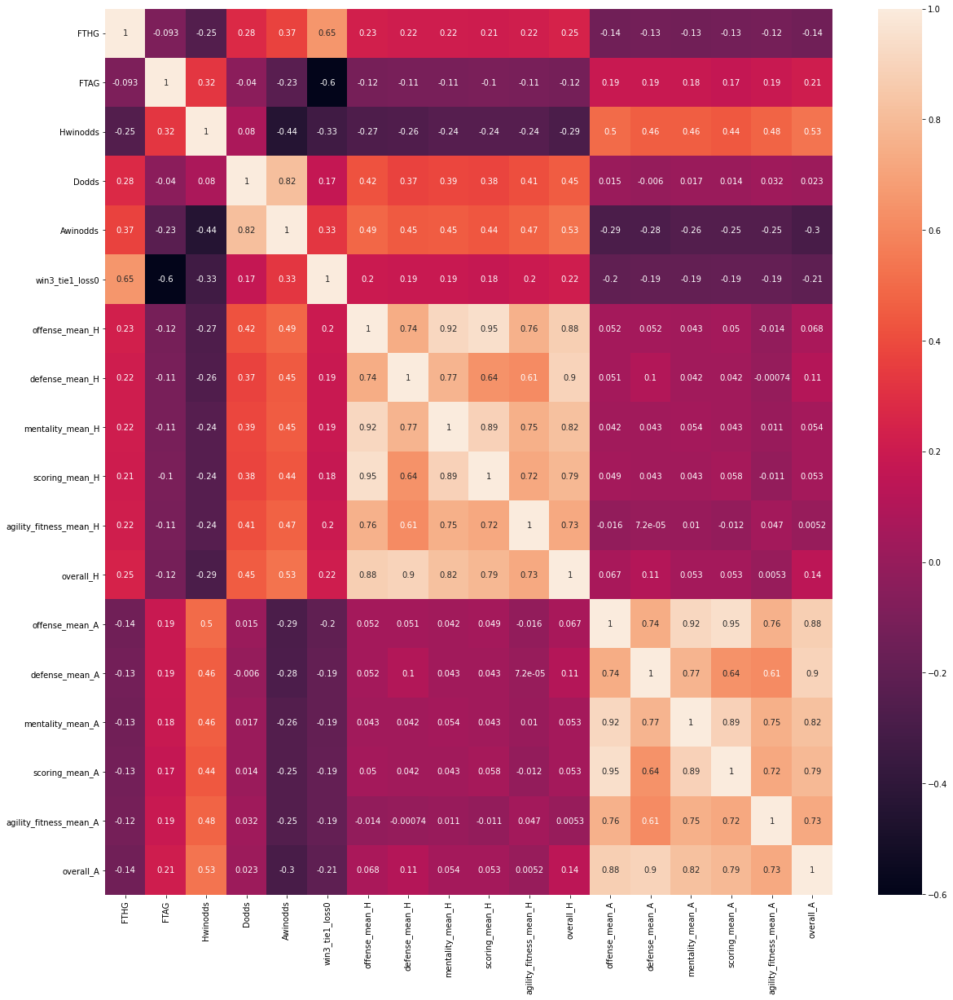

In [74]:
fig, ax = plt.subplots()
fig.set_size_inches(20, 20)
corr1 = model_table.corr()
corr1
sns.heatmap(corr1,annot=True)

In [3]:
# n_homewins = len(model_table(model_table.win3_tie1_loss0 == '3'))
# len(model_table)
model_table.win3_tie1_loss0
len(model_table.loc[model_table['win3_tie1_loss0'] == 3])/11119

0.4483316845040022

In [155]:
len(model_table.loc[model_table['win3_tie1_loss0'] == 1])/11119

0.2506520370536919

# Creating the Train and Target Variables

In [16]:
y_all = mt1['score_diff']
# X_all = model_table[['HomeTeam', 'AwayTeam', 'offense_mean_H', 'defense_mean_H', 'mentality_mean_H',
#        'scoring_mean_H', 'agility_fitness_mean_H', 'offense_mean_A', 'defense_mean_A', 'mentality_mean_A',
#        'scoring_mean_A', 'agility_fitness_mean_A']].copy()
X_all = mt1[['offense_mean_H', 'defense_mean_H', 'mentality_mean_H',
       'scoring_mean_H', 'agility_fitness_mean_H', 'overall_H', 'offense_mean_A', 'defense_mean_A', 'mentality_mean_A',
       'scoring_mean_A', 'agility_fitness_mean_A', 'overall_A']].copy()
# y_all3 = mt3['win3_tie1_loss0']
# X_all3 = mt3[['Season','offense_mean_H', 'defense_mean_H', 'mentality_mean_H',
#        'scoring_mean_H', 'agility_fitness_mean_H', 'overall_H', 'offense_mean_A', 'defense_mean_A', 'mentality_mean_A',
#        'scoring_mean_A', 'agility_fitness_mean_A', 'overall_A']].copy()
# y_all4= mt1['score_diff']

In [17]:
import sklearn

In [256]:
from sklearn.preprocessing import scale

cols = [['offense_mean_H', 'defense_mean_H', 'mentality_mean_H',
       'scoring_mean_H', 'agility_fitness_mean_H', 'overall_H', 'offense_mean_A', 'defense_mean_A', 'mentality_mean_A',
       'scoring_mean_A', 'agility_fitness_mean_A', 'overall_A']]
for col in cols:
    X_all[col] = scale(X_all[col])
for col in cols:
    X_all3[col] = scale(X_all3[col])

In [18]:
def preprocess_features(X):
    output=pd.DataFrame(index=X.index)
    for col, col_data in X.iteritems():
        if col_data.dtype == object:
            col_data = pd.get_dummies(col_data, prefix= col)
        output =output.join(col_data)
    return output
X_all = preprocess_features(X_all)

In [214]:
display(X_all3.head())

,Season,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A
13393,1,-1.471175,-1.329333,-1.687516,-1.786239,-2.069430,-1.994149,-1.386076,-1.109740,-1.636844,-1.472797,-1.866817,-1.282346
13390,1,-1.383437,-2.243777,-1.324634,-1.223217,-0.595431,-1.902516,-0.507385,-1.475878,-0.587456,-0.268792,-0.372974,-1.532812
13389,1,-1.846440,-1.273223,-1.845162,-1.427124,-1.194954,-1.795376,-1.764314,-1.609861,-2.105726,-1.918808,-0.454828,-1.707724
13388,1,-0.623820,-1.031205,-1.205657,-0.659768,-0.338598,-1.052094,-0.042826,-0.097795,-0.201237,0.049654,0.348851,-0.473051
13386,1,0.392443,-0.264622,0.248845,0.340667,-0.490421,-0.645297,-0.122729,-1.060373,0.219600,0.112082,0.321381,-1.007403


In [19]:
# from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, random_state =2,stratify =y_all)
# X_train, X_test, y_train, y_test = train_test_split(X_all3, y_all3, random_state =2,stratify =y_all3)
# X_train, X_test, y_train, y_test = train_test_split(X_all, y_all4, random_state =2,stratify =y_all4)

In [45]:
# from sklearn.metrics import f1_score
# from time import time
# def train_classifier(clf, X_train, y_train):
#     ''' Fits a claissifier to the training data. '''
    
#     start = time()
#     clf.fit(X_train, y_train)
#     end = time()
    
#     print("trained model in {:.4f} seconds".format(end - start))
    
# def predict_labels(clf, features, target):
#     ''' Makes predictions using a fit classifier based on F1 score '''
#     start = time()
#     y_pred = clf.predict(features)
#     end = time()
#     print("make predictions in {:.4f} seconds".format(end - start))
#     return f1_score(target, y_pred, pos_label='H', average='micro'), sum(target == y_pred)/float(len(y_pred))

# def train_predict(clf, X_train, y_train, X_test, y_test):
#     '''Train and predict using a classifier based on F1 score.'''
    
#     print("Training a {} using a training set size of {}...".format(clf.__class__.name__, len(X_train)))
    
#     train_classifier(clf, X_train, y_train)
    
#     f1, acc = predict_labels(clf, X_train, y_train)
#     print(f1, acc)
#     print("F1 score and accuracy score for training set: {:.4f} ,{:.4f}.".format(f1, acc))
    
#     f1, acc = predict_labels(clf, X_test, y_test)
#     print('F1 score and accuracy score for test set: {:.4f} , {:.4f}.'.format(f1, acc))

In [231]:
#for measuring training time
from time import time 
# F1 score (also F-score or F-measure) is a measure of a test's accuracy. 
#It considers both the precision p and the recall r of the test to compute 
#the score: p is the number of correct positive results divided by the number of 
#all positive results, and r is the number of correct positive results divided by 
#the number of positive results that should have been returned. The F1 score can be 
#interpreted as a weighted average of the precision and recall, where an F1 score 
#reaches its best value at 1 and worst at 0.
from sklearn.metrics import f1_score

def train_classifier(clf, X_train, y_train):
    ''' Fits a classifier to the training data. '''
    
    # Start the clock, train the classifier, then stop the clock
    start = time()
    clf.fit(X_train, y_train)
    end = time()
    
    # Print the results
    print ("Trained model in {:.4f} seconds".format(end - start))

    
def predict_labels(clf, features, target):
    ''' Makes predictions using a fit classifier based on F1 score. '''
    
    # Start the clock, make predictions, then stop the clock
    start = time()
    y_pred = clf.predict(features)
    
    end = time()
    # Print and return results
    print ("Made predictions in {:.4f} seconds.".format(end - start))
    
    return f1_score(target, y_pred, pos_label=3), sum(target == y_pred) / float(len(y_pred))


def train_predict(clf, X_train, y_train, X_test, y_test):
    ''' Train and predict using a classifer based on F1 score. '''
    
    # Indicate the classifier and the training set size
    print ("Training a {} using a training set size of {}. . .".format(clf.__class__.__name__, len(X_train)))
    
    # Train the classifier
    train_classifier(clf, X_train, y_train)
    
    # Print the results of prediction for both training and testing
    f1, acc = predict_labels(clf, X_train, y_train)
    print (f1, acc)
    print ("F1 score and accuracy score for training set: {:.4f} , {:.4f}.".format(f1 , acc))
    f1, acc = predict_labels(clf, X_test, y_test)
    print ("F1 score and accuracy score for test set: {:.4f} , {:.4f}.".format(f1 , acc))

In [21]:
# clf_A = LogisticRegression(random_state = 42)
# clf_B = SVC(random_state=912, kernel='rbf')
# clf_C = xgb.XGBClassifier(seed = 82)
clf_4 = xgb.XGBRegressor()
clf_4.fit(X_train,y_train)

output = clf_4.predict(data=X_all)
output
import pickle
filename = 'finalized_model_score_prediction.sav'
pickle.dump(clf_4, open('finalized_model_score_prediction.sav', 'wb'))

# # print(train_predict(clf_A, X_train, y_train, X_test, y_test))


# # print(train_predict(clf_B, X_train, y_train, X_test, y_test))


# # print(train_predict(clf_C, X_train, y_train, X_test, y_test))

# # print(train_predict(clf_4, X_train, y_train, X_test, y_test))
# import sys
# import numpy
# numpy.set_printoptions(threshold=sys.maxsize)
# score_diff_prediction_model = pickle.load(open('finalized_model_score_prediction.sav', 'rb'))
# print(score_diff_prediction_model.predict(X_all))


In [25]:
mt1['score_diff_pred'] = output
mt1.head(50)


,Season,Datetime,League,HomeTeam,AwayTeam,FTHG,FTAG,Hwinodds,Dodds,Awinodds,win3_tie1_loss0,club_name_H,offense_mean_H,defense_mean_H,mentality_mean_H,scoring_mean_H,agility_fitness_mean_H,overall_H,club_name_A,offense_mean_A,defense_mean_A,mentality_mean_A,scoring_mean_A,agility_fitness_mean_A,overall_A,winloss_tie_binary,score_diff,score_diff_pred
13394,1,2014-08-08 00:00:00,Le Championnat,Stade de Reims,Paris Saint-Germain,2,2,9.50,4.50,1.36,1,Stade de Reims,57.676190,61.050980,53.035294,52.217927,65.152941,67.235294,Paris Saint-Germain,67.885714,73.466667,64.400000,63.385714,72.535185,80.833333,1,0,-0.364944
13393,1,2014-08-09 00:00:00,Le Championnat,Évian Thonon Gaillard FC,Stade Malherbe Caen,0,3,2.38,3.20,3.00,0,Évian Thonon Gaillard FC,53.733083,59.476974,49.600000,47.499530,61.020833,64.578947,Stade Malherbe Caen,53.982418,60.188462,49.738462,48.571429,61.535043,67.076923,3,-3,-2.396156
13392,1,2014-08-09 00:00:00,Le Championnat,Sporting Club de Bastia,Olympique de Marseille,3,3,3.90,3.10,2.05,1,Sporting Club de Bastia,55.900823,56.081454,52.657143,52.736842,62.353662,64.952381,Olympique de Marseille,60.385204,64.964286,56.512500,54.628827,68.771825,71.000000,1,0,0.452738
13390,1,2014-08-09 00:00:00,Le Championnat,OGC Nice,Toulouse Football Club,3,2,2.63,3.10,2.75,3,OGC Nice,54.034372,56.320802,50.761905,49.476907,64.741855,64.904762,Toulouse Football Club,56.990930,58.928571,53.085714,52.783447,65.284832,66.190476,3,1,0.488007
13389,1,2014-08-09 00:00:00,Le Championnat,FC Nantes,Racing Club de Lens,1,0,2.00,3.25,3.90,3,FC Nantes,52.444444,59.670635,49.095238,48.760771,63.228395,65.285714,Racing Club de Lens,52.687384,58.467532,48.242857,47.011132,65.079365,65.571429,3,1,1.507768
13388,1,2014-08-09 00:00:00,Le Championnat,En Avant de Guingamp,AS Saint-Étienne,0,2,3.30,3.10,2.30,0,En Avant de Guingamp,56.642857,60.505952,51.142857,51.455782,65.390212,67.928571,AS Saint-Étienne,58.581513,63.670588,54.317647,53.897479,67.096732,69.941176,3,-2,-0.887029
13387,1,2014-08-09 00:00:00,Le Championnat,LOSC Lille,FC Metz,0,0,1.50,4.10,6.50,1,LOSC Lille,60.542517,67.654762,58.242857,55.634354,67.292328,72.642857,FC Metz,55.514881,57.819444,51.144444,51.363095,64.264660,65.888889,1,0,0.681607
13386,1,2014-08-09 00:00:00,Le Championnat,Montpellier HSC,FC Girondins de Bordeaux,0,1,2.30,3.10,3.20,0,Montpellier HSC,60.132653,63.151786,55.800000,54.969388,65.006944,69.375000,FC Girondins de Bordeaux,58.307937,60.358333,55.660000,54.115873,67.027778,68.050000,3,-1,-0.112262
13382,1,2014-08-10 00:00:00,Le Championnat,Olympique Lyonnais,Stade Rennais FC,2,0,1.80,3.40,4.75,3,Olympique Lyonnais,57.264172,62.130952,53.123810,53.564626,67.358025,68.428571,Stade Rennais FC,61.664881,64.168750,57.125000,56.161310,67.782407,71.937500,3,2,1.266345
13381,1,2014-08-10 00:00:00,Le Championnat,AS Monaco,FC Lorient,1,2,1.40,4.33,8.50,0,AS Monaco,61.195742,64.973558,55.200000,56.457418,66.618056,72.562500,FC Lorient,56.759244,60.217647,52.200000,51.052941,64.549673,67.200000,3,-1,0.305711


In [225]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer


# TODO: Create the parameters list you wish to tune
parameters = { 'learning_rate' : [0.1],
               'n_estimators' : [40],
               'max_depth': [3],
               'min_child_weight': [3],
               'gamma':[5],
               'subsample' : [0.8],
               'colsample_bytree' : [0.8],
               'scale_pos_weight' : [1],
               'reg_alpha':[1e-5]
             }  

# TODO: Initialize the classifier
clf = xgb.XGBClassifier(seed=2)

# TODO: Make an f1 scoring function using 'make_scorer' 
f1_scorer = make_scorer(accuracy_score)

# TODO: Perform grid search on the classifier using the f1_scorer as the scoring method
grid_obj = GridSearchCV(clf,
                        scoring=f1_scorer,
                        param_grid=parameters,
                        cv=5)

# TODO: Fit the grid search object to the training data and find the optimal parameters
grid_obj = grid_obj.fit(X_train,y_train)

# Get the estimator
clf = grid_obj.best_estimator_
print (clf)

# Report the final F1 score for training and testing after parameter tuning
f1, acc = predict_labels(clf, X_train, y_train)
print ("F1 score and accuracy score for training set: {:.4f} , {:.4f}.".format(f1 , acc))
    
f1, acc = predict_labels(clf, X_test, y_test)
print ("F1 score and accuracy score for test set: {:.4f} , {:.4f}.".format(f1 , acc))

/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:06:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:06:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:06:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:06:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:06:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Users/SirLawrenceKatz/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:06:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=40, n_jobs=4, num_parallel_tree=1, random_state=2,
              reg_alpha=1e-05, reg_lambda=1, scale_pos_weight=1, seed=2,
              subsample=0.8, tree_method='exact', validate_parameters=1,
              verbosity=None)
Made predictions in 0.0127 seconds.
F1 score and accuracy score for training set: 0.7729 , 0.7016.
Made predictions in 0.0050 seconds.
F1 score a

In [88]:
from sklearn.metrics import accuracy_score
X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.33, random_state=7)
# fit model no training data
model = xgb.XGBClassifier()
eval_set = [(X_test, y_test)]
model.fit(X_train, y_train, early_stopping_rounds=10, eval_metric="mlogloss", eval_set=eval_set, verbose=True)
# make predictions for test data
y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_test, predictions, )
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[0]	validation_0-mlogloss:1.05982
[1]	validation_0-mlogloss:1.03852
[2]	validation_0-mlogloss:1.02547
[3]	validation_0-mlogloss:1.01857
[4]	validation_0-mlogloss:1.01577
[5]	validation_0-mlogloss:1.01395
[6]	validation_0-mlogloss:1.01286
[7]	validation_0-mlogloss:1.01256
[8]	validation_0-mlogloss:1.01221
[9]	validation_0-mlogloss:1.01223
[10]	validation_0-mlogloss:1.01351
[11]	validation_0-mlogloss:1.01407
[12]	validation_0-mlogloss:1.01469
[13]	validation_0-mlogloss:1.01453
[14]	validation_0-mlogloss:1.01630
[15]	validation_0-mlogloss:1.01702
[16]	validation_0-mlogloss:1.01801
[17]	validation_0-mlogloss:1.01907
[18]	validation_0-mlogloss:1.01930
Accuracy: 50.71%


In [89]:
# model = xgb.XGBClassifier()
# eval_set = [(X_train, y_train), (X_test, y_test)]
# model.fit(X_train, y_train, eval_metric=["error", "mlogloss"], eval_set=eval_set, verbose=True)
# # make predictions for test data
# y_pred = model.predict(X_test)
# predictions = [round(value) for value in y_pred]
# # evaluate predictions
# accuracy = accuracy_score(y_test, predictions)
# print("Accuracy: %.2f%%" % (accuracy * 100.0))
# # retrieve performance metrics
# results = model.evals_result()
# epochs = len(results['validation_0']['error'])
# x_axis = range(0, epochs)
# # plot log loss
# fig, ax = pyplot.subplots()
# ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
# ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
# ax.legend()
# pyplot.ylabel('Log Loss')
# pyplot.title('XGBoost Log Loss')
# pyplot.show()
# # plot classification error
# fig, ax = pyplot.subplots()
# ax.plot(x_axis, results['validation_0']['error'], label='Train')
# ax.plot(x_axis, results['validation_1']['error'], label='Test')
# ax.legend()
# pyplot.ylabel('Classification Error')
# pyplot.title('XGBoost Classification Error')
# pyplot.show()

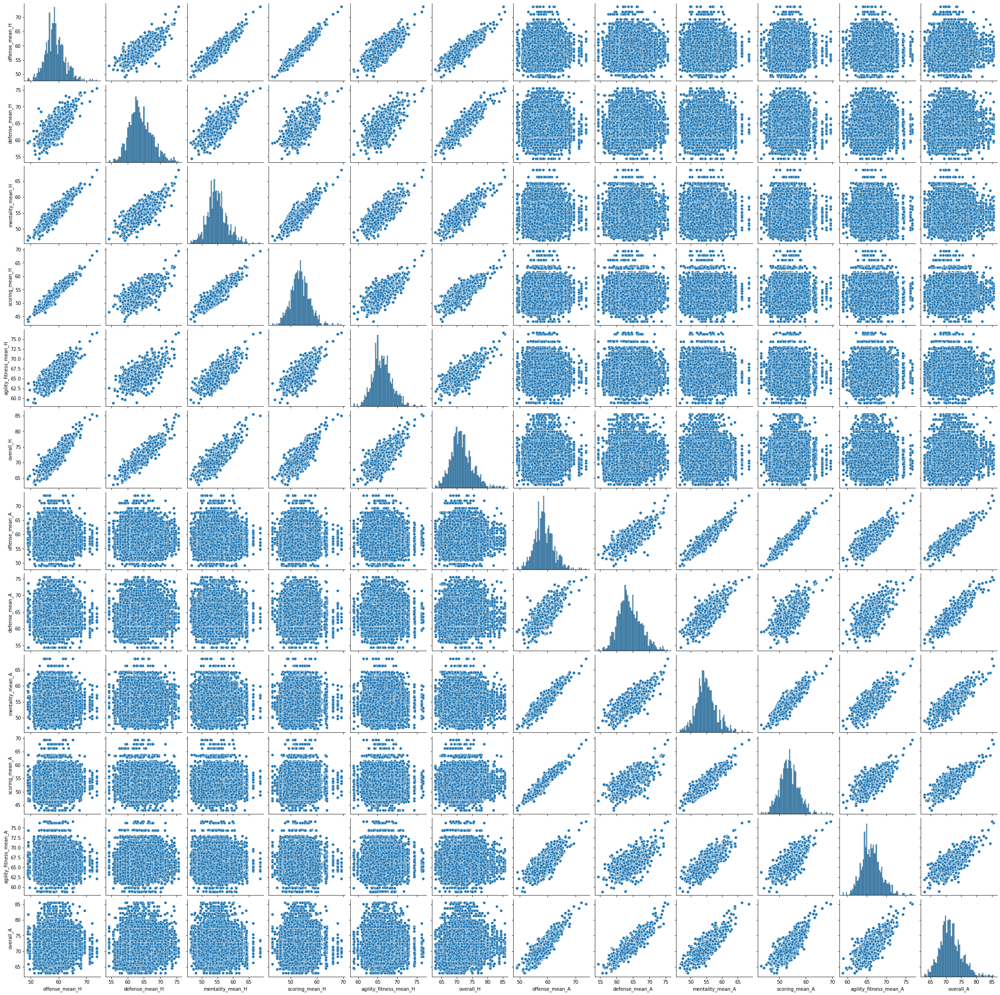

In [90]:
sns.pairplot(X_all)




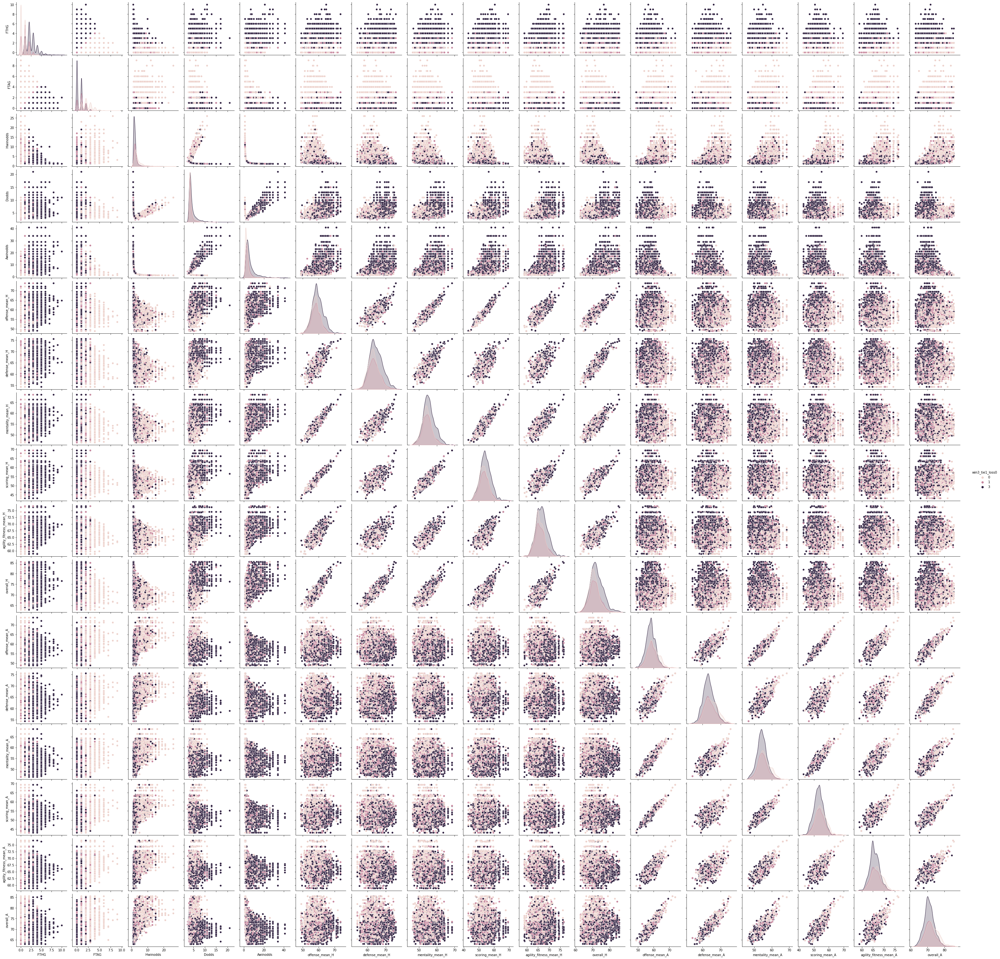

In [113]:
sns.pairplot(model_table, hue="win3_tie1_loss0")

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.2, random_state=0)

In [107]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [108]:
from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [109]:
from sklearn.decomposition import PCA

pca = PCA(n_components=1)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [110]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

In [111]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))

[[713   0   0]
 [554   0   0]
 [957   0   0]]
0.3205935251798561


[09:30:25] WARNING: ../src/learner.cc:541: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:30:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


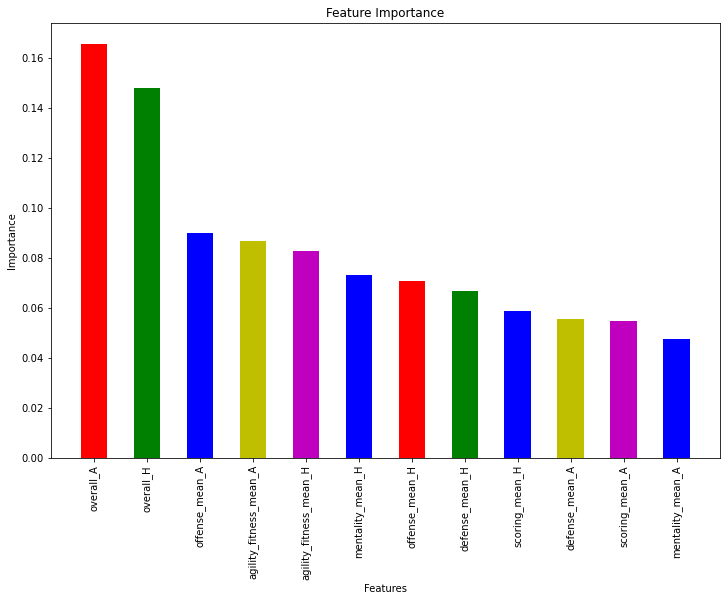

In [141]:

clf_F = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=3, monotone_constraints='()',
              n_estimators=40, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=2, reg_alpha=1e-05,
              reg_lambda=1, scale_pos_weight=1, seed=2, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

clf_F.fit(X_train,y_train)

importance_data = sorted(list(zip(X_all.columns,clf_F.feature_importances_)),key=lambda tpl:tpl[1],reverse=True)

xs = range(len(importance_data))
labels = [x for (x,_) in importance_data]
ys = [y for (_,y) in importance_data]

# plot
plt.figure(figsize=(12,8))
plt.clf()
plt.bar(xs,ys,width=0.5, color=('r', 'g', 'b', 'y', 'm', 'b', 'r', 'g', 'b', 'y', 'm', 'b'))
plt.xticks(xs,labels, rotation='vertical')
plt.xlabel("Features")
plt.ylabel("Importance")
plt.title('Feature Importance')
plt.show()
plt.figsize=(20, 10)

# print(train_predict(clf_A, X_train, y_train, X_test, y_test))

In [143]:

clf_F = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=3, monotone_constraints='()',
              n_estimators=40, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=2, reg_alpha=1e-05,
              reg_lambda=1, scale_pos_weight=1, seed=2, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

clf_F.fit(X_train,y_train)

[09:37:58] WARNING: ../src/learner.cc:541: 
Parameters: { scale_pos_weight } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:37:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=5, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=40, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=2, reg_alpha=1e-05,
              reg_lambda=1, scale_pos_weight=1, seed=2, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [145]:
y_pred = clf_F.predict(X_test)
cm = confusion_matrix(y_test, y_pred)

<AxesSubplot:>

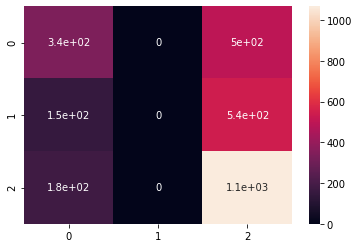

In [146]:
import seaborn as sns
sns.heatmap(cm, annot=True)

Text(0.5, 1.0, 'Home Team Wins vs Ties vs Losses')

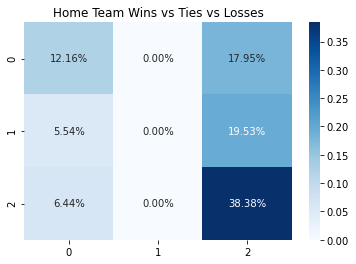

In [233]:
sns.heatmap(cm/np.sum(cm), annot=True, 
            fmt='.2%', cmap='Blues')
plt.title('Home Team Wins vs Ties vs Losses')

In [ ]:
sns.pairplot(model_table, hue="win3_tie1_loss0")

<AxesSubplot:>

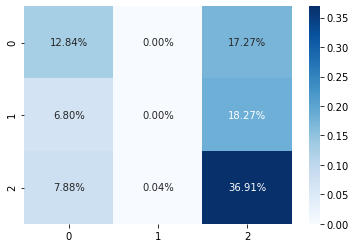

In [159]:
# labels = ["‘True Neg’","’False Pos’","’False Neg’","’True Pos’"]
# labels = np.asarray(labels).reshape(2,2)
# sns.heatmap(cm, annot=labels, fmt="", cmap='Blues')
clf_A = LogisticRegression(random_state = 42)
# clf_B = SVC(random_state=912, kernel='rbf')
# clf_C = xgb.XGBClassifier(seed = 82)
clf_A.fit(X_train,y_train)
y_pred1 = clf_A.predict(X_test)
cm1 = confusion_matrix(y_test, y_pred1)
sns.heatmap(cm1/np.sum(cm1), annot=True, 
            fmt='.2%', cmap='Blues')